In [1]:
import pandas as pd
import numpy as np

In [17]:
test = pd.read_csv('test.csv',encoding = 'utf-8')
train = pd.read_csv('train.csv',encoding = 'utf-8')
age_info = pd.read_csv('age_gender_info.csv', encoding = 'utf-8')
submission = pd.read_csv('sample_submission1.csv',encoding = 'utf-8')

- target variable : 등록차량수

- feature
    - category
        - 단지코드 : C2483, C2515, ... 총 423개
        - 임대건물구분 : 아파트, 상가
        - 지역 : 경기도, 경상남도, 부산, 대전, ... 16개 시도
        - 공급유형 : 국민임대, 임대상가, 공공임대,  ... 10개
        - 신분 : 일반, 철거민, 장기근속자, ... 14개
    - numeric
        - 총세대수
        - 전용면적
        - 전용면적별세대수
        - 공가수
        - 임대보증금
        - 임대료
        - 도보 10분거리 내 지하철역 수 
        - 도보 10분거리 내 버스정류장 수 
        - 단지내주차면수
        

#### 도보 10분거리 내 지하철역 수와 도보 10분거리 내 버스정류장 수를 묶어서 새로운 변수를 만듦.

In [3]:
df_train = train.copy()
df_test = test.copy()
df_train['대중교통 정류장(역) 수'] = df_train.iloc[:,-3] + df_train.iloc[:,-4]
df_train.drop(['도보 10분거리 내 지하철역 수(환승노선 수 반영)','도보 10분거리 내 버스정류장 수'],axis = 1, inplace = True)
df_test['대중교통 정류장(역) 수'] = df_test.iloc[:,-2] + df_test.iloc[:,-3]
df_test.drop(['도보 10분거리 내 지하철역 수(환승노선 수 반영)','도보 10분거리 내 버스정류장 수'],axis = 1, inplace = True)

- category variable 중 하나인 '신분'의 index를 묶는다.
    - 일반
    - 철거민
    - 장기근속자
    - 3차탈락자, 2차탈락자, 1차 탈락자 -> 탈락자
    - 전세형- 소득100%초과, 전세형 -> 전세형
    - 산업단지근로자, 고령자, 차상위, 기초생활수급자, 사회초년생, 신혼부부 -> 기타


- category variable 중 하나인 '공급유형'의 index를 묶는다.
    - 국민임대, 장기전세 -> 국민임대
    - 임대상가
    - 행복주택, 공공분양 -> 행복주택
    - 영구임대
    - 공공임대(10년), 공공임대(50년), 공공임대(분납), 공공임대(5년) -> 공공임대

In [4]:
cat_cols = ['임대건물구분','지역','공급유형','신분']
num_cols = ['총세대수','전용면적','전용면적별세대수','공가수','임대보증금','임대료','대중교통 정류장(역) 수', '단지내주차면수']

In [5]:
df_train['신분'] = df_train['신분'].replace('[0-9]차탈락자','탈락자',regex = True)
df_train['신분'] = df_train['신분'].replace('전세형-소득100%초과','전세형')
df_train['신분'] = df_train['신분'].replace(['산업단지근로자','고령자','차상위','기초생활수급자','사회초년생','신혼부부'],'기타')
df_train['공급유형'] = df_train['공급유형'].replace(['공공임대(10년)','공공임대(50년)','공공임대(분납)','공공임대(5년)'],'공공임대')
df_train['공급유형'] = df_train['공급유형'].replace('장기전세','국민임대')
df_train['공급유형'] = df_train['공급유형'].replace('공공분양','행복주택')
for category in cat_cols:
    df_train = pd.concat([df_train,pd.get_dummies(df_train[category])], axis = 1)
df_train.drop(['신분','공급유형'],axis = 1, inplace = True)
df_train = df_train.fillna(0)

In [6]:
df_train

,단지코드,총세대수,임대건물구분,지역,전용면적,전용면적별세대수,공가수,임대보증금,임대료,단지내주차면수,...,국민임대,영구임대,임대상가,행복주택,기타,일반,장기근속자,전세형,철거민,탈락자
0,C2483,900,아파트,경상북도,39.72,134,38.0,15667000,103680,813.0,...,1,0,0,0,0,1,0,0,0,0
1,C2483,900,아파트,경상북도,39.72,15,38.0,15667000,103680,813.0,...,1,0,0,0,0,1,0,0,0,0
2,C2483,900,아파트,경상북도,51.93,385,38.0,27304000,184330,813.0,...,1,0,0,0,0,1,0,0,0,0
3,C2483,900,아파트,경상북도,51.93,15,38.0,27304000,184330,813.0,...,1,0,0,0,0,1,0,0,0,0
4,C2483,900,아파트,경상북도,51.93,41,38.0,27304000,184330,813.0,...,1,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2947,C2532,239,아파트,강원도,49.20,19,7.0,11346000,116090,171.0,...,1,0,0,0,0,1,0,0,0,0
2948,C2532,239,아파트,강원도,51.08,34,7.0,14005000,142310,171.0,...,1,0,0,0,0,1,0,0,0,0
2949,C2532,239,아파트,강원도,51.73,34,7.0,14005000,142310,171.0,...,1,0,0,0,0,1,0,0,0,0
2950,C2532,239,아파트,강원도,51.96,114,7.0,14005000,142310,171.0,...,1,0,0,0,0,1,0,0,0,0


In [7]:
df_test['신분'] = df_test['신분'].replace('[0-9]차탈락자','탈락자',regex = True)
df_test['신분'] = df_test['신분'].replace('전세형-소득100%초과','전세형')
df_test['신분'] = df_test['신분'].replace('전세형-소득100%이하','전세형')
df_test['신분'] = df_test['신분'].replace(['산업단지근로자','고령자','차상위','기초생활수급자','사회초년생','신혼부부'],'기타')
df_test['공급유형'] = df_test['공급유형'].replace(['공공임대(10년)','공공임대(50년)','공공임대(분납)','공공임대(5년)'],'공공임대')
df_test['공급유형'] = df_test['공급유형'].replace('장기전세','국민임대')
df_test['공급유형'] = df_test['공급유형'].replace('공공분양','행복주택')
for category in cat_cols:
    df_test = pd.concat([df_test,pd.get_dummies(df_test[category])], axis = 1)
df_test.drop(['신분','공급유형'],axis = 1, inplace = True)
df_test = df_test.fillna(0)

- onehotencoding


In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

<Figure size 720x720 with 0 Axes>

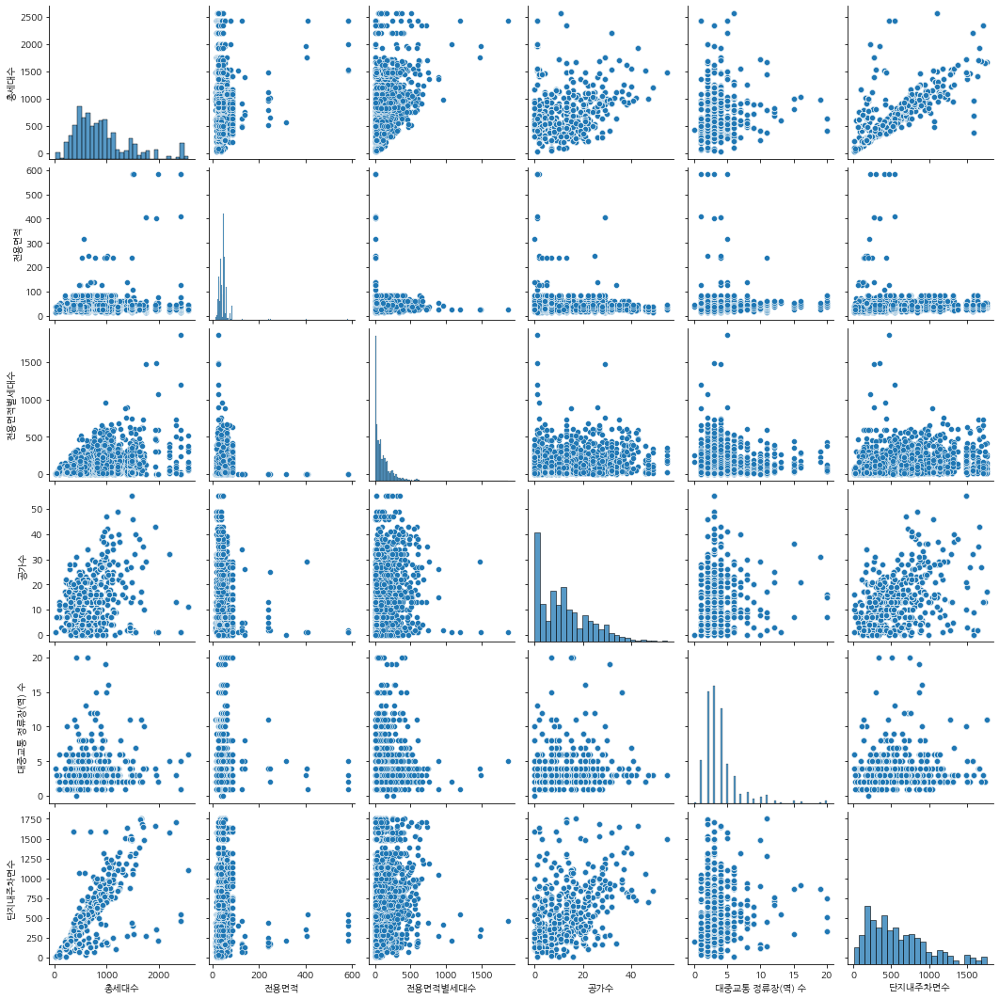

In [272]:
num_df = df_train[num_cols]
plt.rcParams['font.family'] = 'NanumGothic'
plt.figure(figsize = (10,10))
sns.pairplot(num_df)
plt.show()

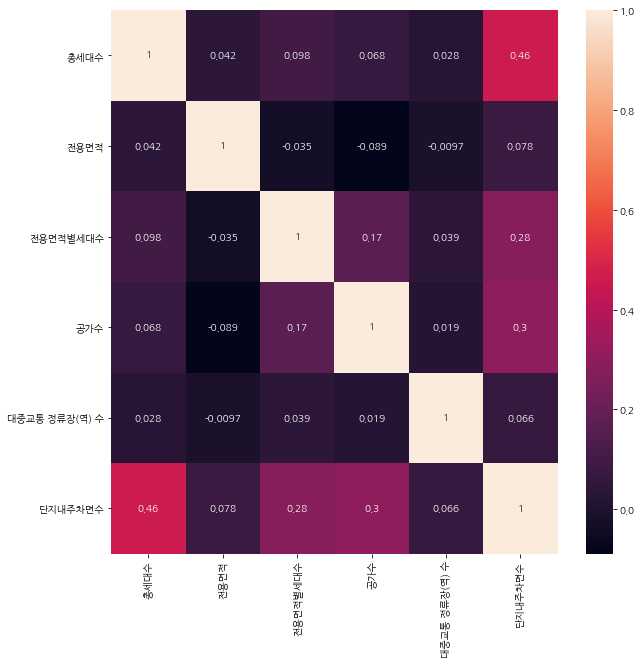

In [273]:
plt.figure(figsize = (10,10))
sns.heatmap(num_df.corr(), annot = True)
plt.show()

In [9]:
feature_cols_train = df_train.columns.difference(['등록차량수'])
feature_cols_test = df_test.columns.difference(['등록차량수'])

y_train = df_train.loc[:,['등록차량수','단지코드']].copy().groupby('단지코드').mean()
x_train = df_train[feature_cols_train].copy().groupby('단지코드').mean()
x_test = df_test[feature_cols_test].copy().groupby('단지코드').mean()

In [10]:
x_train.drop(['서울특별시'],axis = 1, inplace = True)

In [11]:
x_train.shape, y_train.shape, x_test.shape

((423, 34), (423, 1), (150, 34))

In [12]:
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor

In [13]:
lr = LinearRegression().fit(x_train, y_train)
lr.score(x_train,y_train)

0.8066071049978905

In [14]:
rf = RandomForestRegressor().fit(x_train,y_train)
y_pred = pd.DataFrame(rf.predict(x_test),columns = ['num'])

<ipython-input-14-9941b609cc4d>:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf = RandomForestRegressor().fit(x_train,y_train)


In [15]:
y_pred = y_pred.astype('int64')
y_pred

,num
0,318
1,251
2,756
3,329
4,50
...,...
145,883
146,1063
147,264
148,185


In [20]:
code = submission.sort_values('code').reset_index()['code']
code

0      C1003
1      C1006
2      C1016
3      C1019
4      C1030
       ...  
145    C2653
146    C2675
147    C2676
148    C2688
149    C2691
Name: code, Length: 150, dtype: object

In [21]:
sub = pd.concat([code,y_pred],axis = 1)
sub

,code,num
0,C1003,318
1,C1006,251
2,C1016,756
3,C1019,329
4,C1030,50
...,...,...
145,C2653,883
146,C2675,1063
147,C2676,264
148,C2688,185


In [22]:
sub.to_csv('submission.csv',encoding = 'utf-8',index = False)

In [451]:
submission

,code,num
0,C1072,306
1,C1128,255
2,C1456,748
3,C1840,317
4,C1332,55
...,...,...
145,C2456,853
146,C1266,1036
147,C2152,297
148,C1267,189
